# Comparing car counting models

In [5]:
import cv2
import matplotlib.pyplot as plt
import cvlib as cv
from cvlib.object_detection import draw_bbox

2022-10-23 14:34:46.746752: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [6]:
import cv2
import numpy as np


class VehicleDetector:

    def __init__(self):
        # Load Network
        net = cv2.dnn.readNet("/Users/rebecca/dnn_model/yolov4.weights", "/Users/rebecca/dnn_model/yolov4.cfg")
        self.model = cv2.dnn_DetectionModel(net)
        self.model.setInputParams(size=(832, 832), scale=1 / 255)


        # Allow classes containing Vehicles only
        self.classes_allowed = [2, 3, 5, 6, 7]


    def detect_vehicles(self, img):
        # Detect Objects
        vehicles_boxes = []
        class_ids, scores, boxes = self.model.detect(img, nmsThreshold=0.4)
        for class_id, score, box in zip(class_ids, scores, boxes):
            if score < 0.5:
                # Skip detection with low confidence
                continue

            if class_id in self.classes_allowed:
                vehicles_boxes.append(box)

        return vehicles_boxes

# Load Vehicle Detector
vd = VehicleDetector()  # instantiate the instance

In [10]:
def plot_compare(img):
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    img1 = cv2.imread(img)
    bbox, label, conf = cv.detect_common_objects(img1)
    output_image = draw_bbox(img1, bbox, label, conf)
    print(label)
    vehicle_count_1 = label.count('car')+label.count('truck')+label.count('bus')+label.count('motorcycle')
    cv2.putText(output_image, "Count:" + str(vehicle_count_1), (1600, 1000), 2, 2, (0, 102, 240), 4)
    axs[0].imshow(output_image)
    axs[0].set_title('10 line results', fontsize=24)

    img2 = cv2.imread(img)
    vehicle_boxes = vd.detect_vehicles(img2)
    vehicle_count_2 = len(vehicle_boxes)
    # width then height
    for box in vehicle_boxes:
        x, y, w, h = box
        cv2.rectangle(img2, (x, y), (x + w, y + h), (25, 0, 180), 3)
        cv2.putText(
            img2, "Count:" + str(vehicle_count_2), (1600, 1000), 2, 2, (0, 102, 240), 4
        )
    axs[1].imshow(img2)
    axs[1].set_title('dnn results', fontsize=24)
    plt.show()

['car']


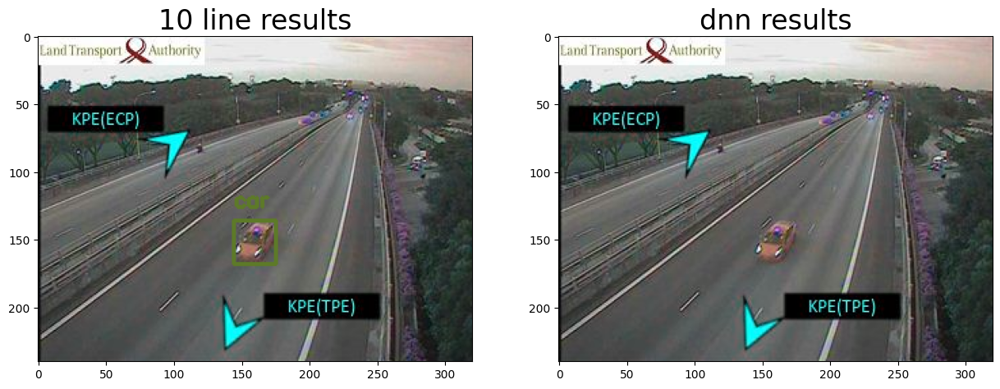

In [11]:
plot_compare('/Users/rebecca/images/2022_10_15_06_50/1005_0643_20221015065001_101509.jpg')

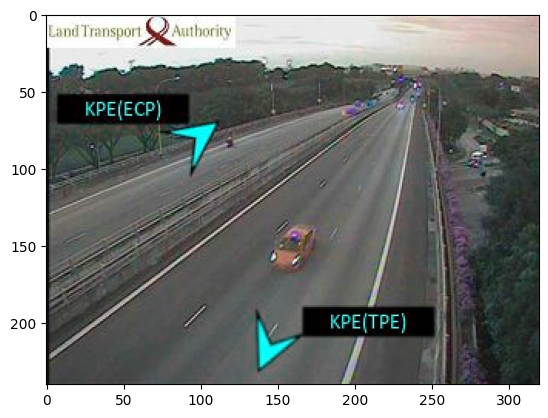

In [ ]:
#dnn model
img = cv2.imread('/Users/rebecca/images/2022_10_15_06_50/1005_0643_20221015065001_101509.jpg')
vehicle_boxes = vd.detect_vehicles(img)
vehicle_count = len(vehicle_boxes)
# width then height
for box in vehicle_boxes:
    x, y, w, h = box
    cv2.rectangle(img, (x, y), (x + w, y + h), (25, 0, 180), 3)

    cv2.putText(
            img, "Count:" + str(vehicle_count), (1600, 1000), 2, 2, (0, 102, 240), 4
        )
plt.imshow(img)

In [ ]:
#10 lines
img = cv2.imread('/Users/rebecca/images/2022_10_15_06_50/1005_0643_20221015065001_101509.jpg')
bbox, label, conf = cv.detect_common_objects(img)
#output_image = draw_bbox(img, bbox, label, conf)
vehicle_count = label.count('car')
#plt.imshow(output_image)
print(vehicle_count)

1


['truck', 'car', 'car', 'car']


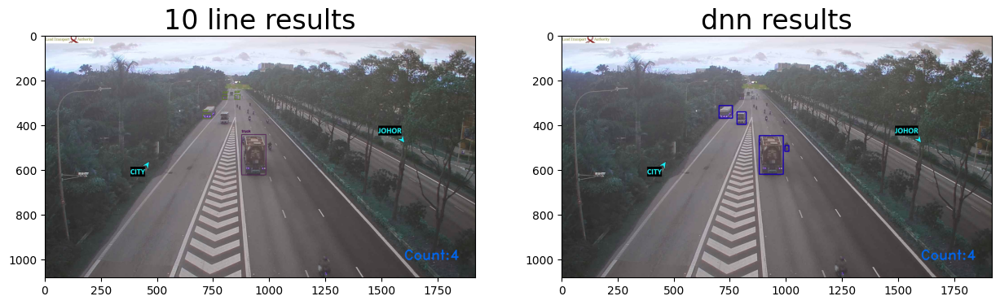

['truck']


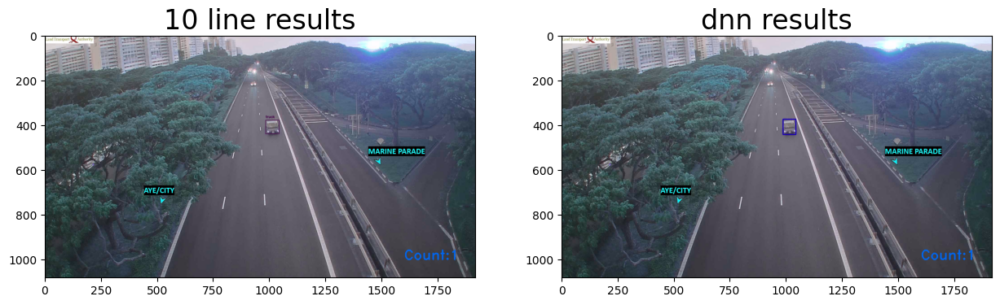

['car', 'car', 'car', 'car', 'car', 'traffic light', 'traffic light']


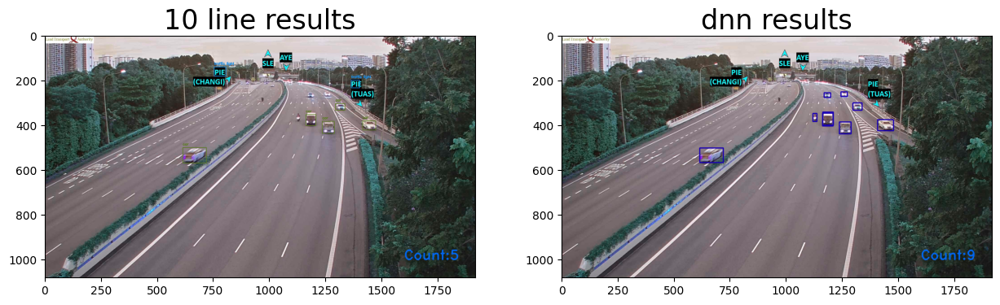

[]


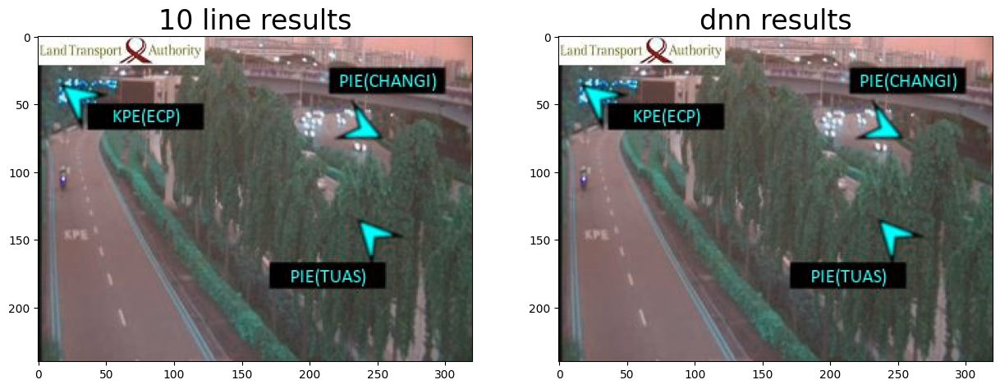

['car', 'car', 'car', 'traffic light', 'motorcycle', 'car', 'car']


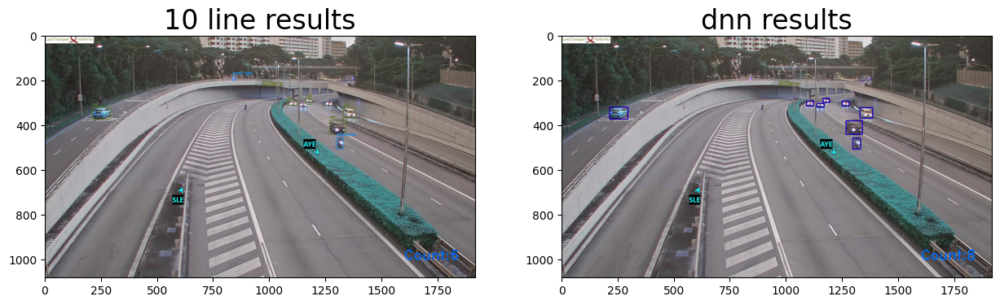

['car', 'bus', 'truck', 'car', 'traffic light']


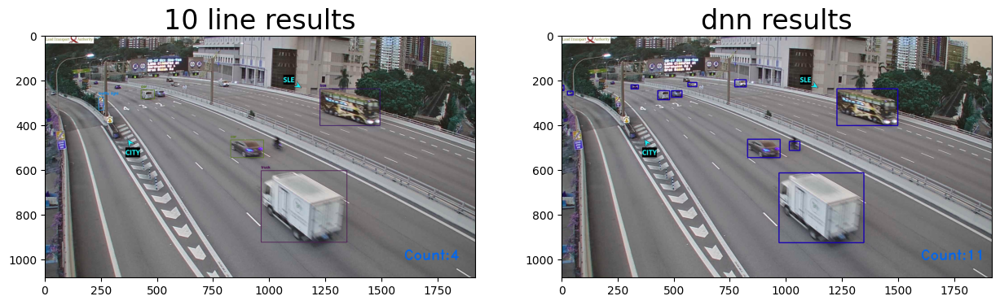

['car', 'truck', 'car', 'car', 'car']


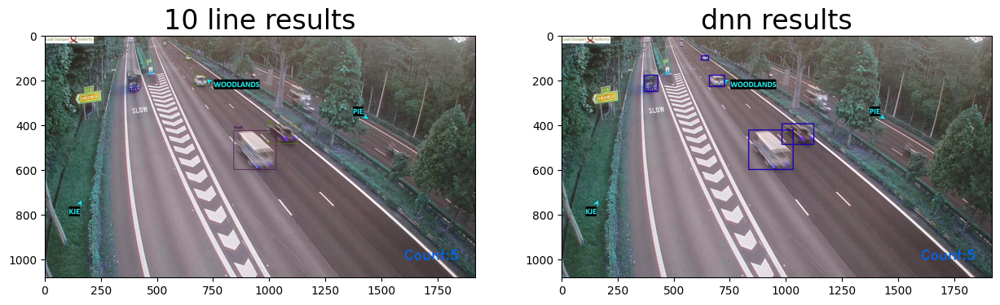

['traffic light', 'car', 'car']


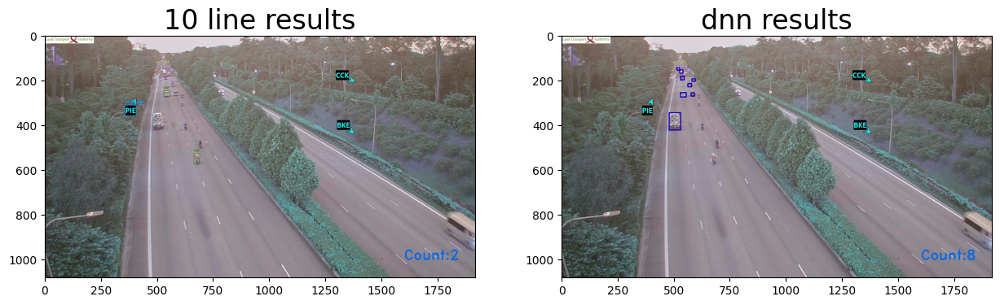

['car', 'car', 'traffic light', 'car', 'car', 'car', 'car', 'traffic light', 'person', 'person']


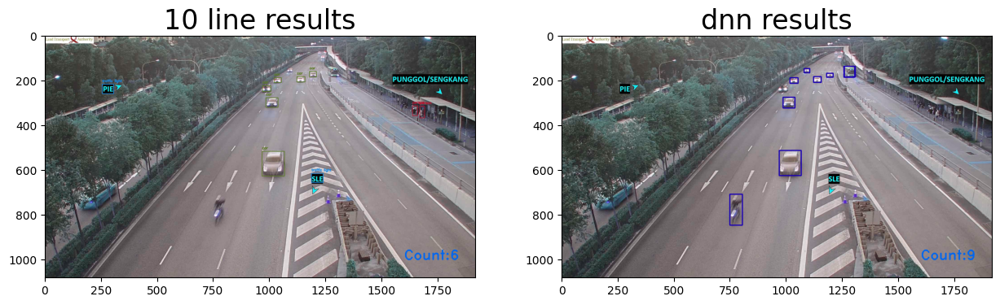

['car', 'car', 'car', 'car']


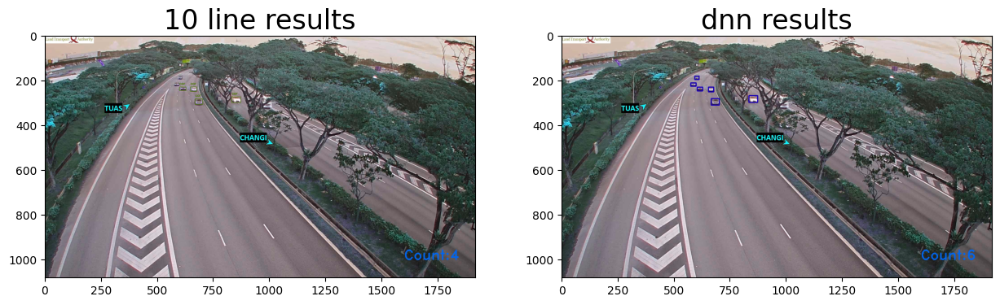

[]


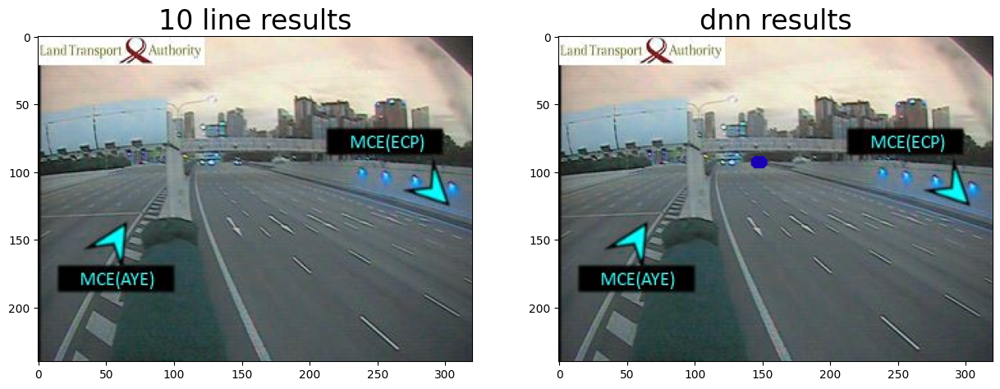

['car', 'car']


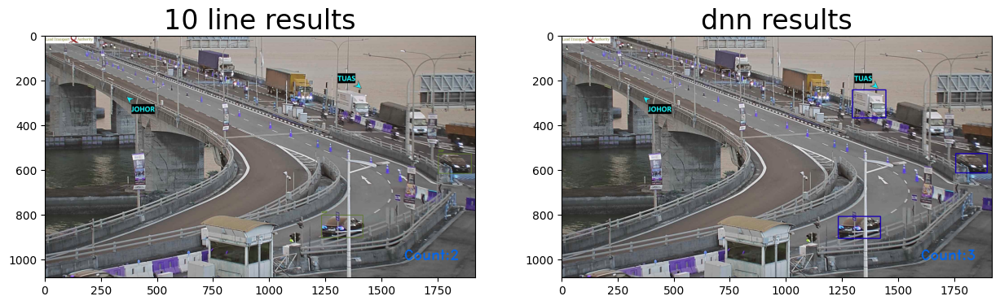

[]


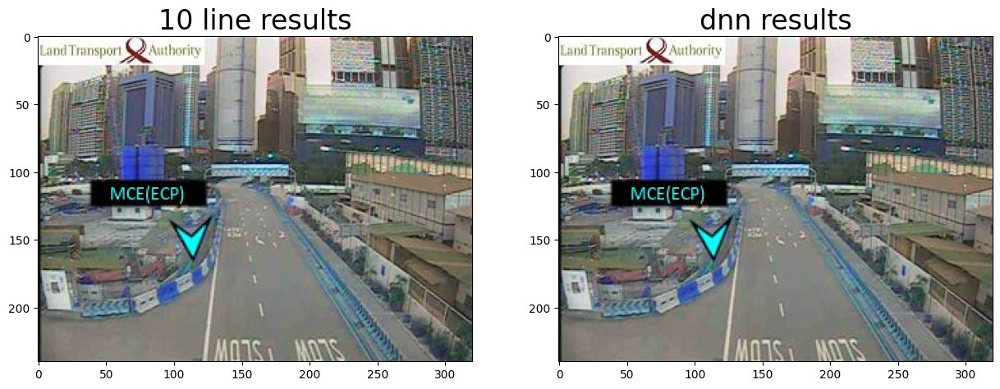

['car', 'car', 'car']


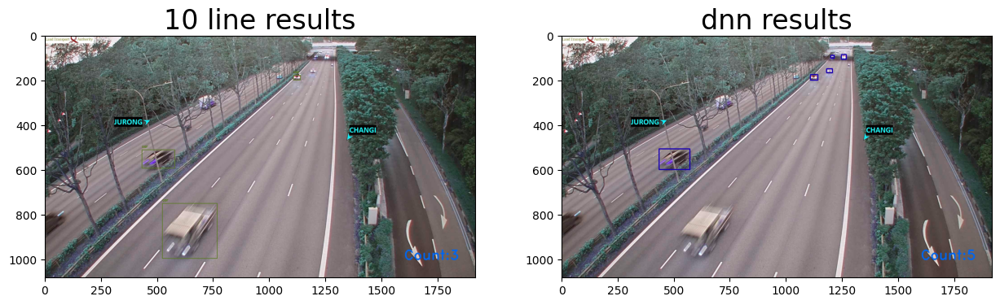

['car', 'truck', 'car']


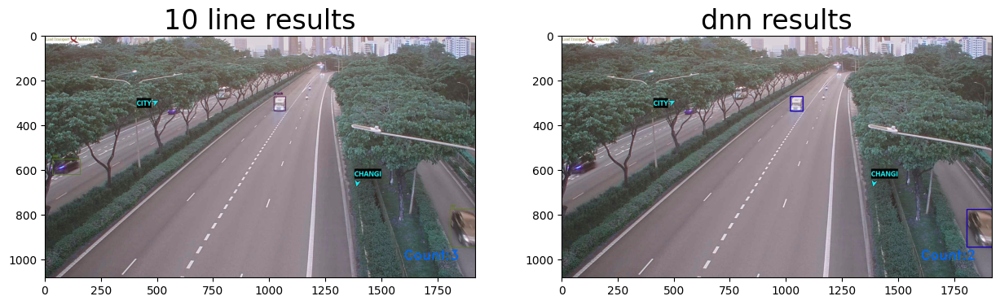

['car', 'car', 'car', 'car', 'traffic light', 'car', 'car', 'car']


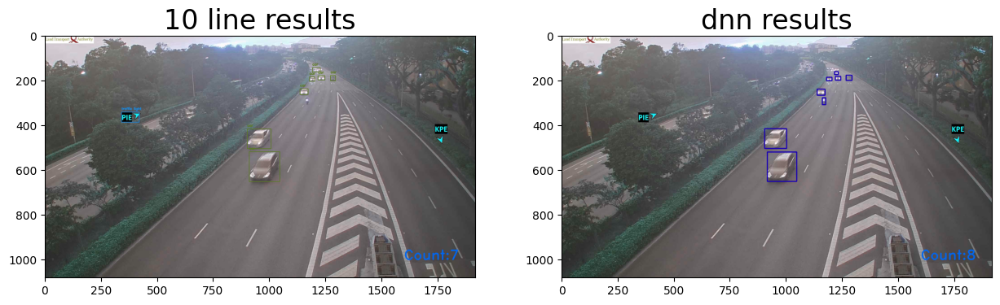

['car', 'car']


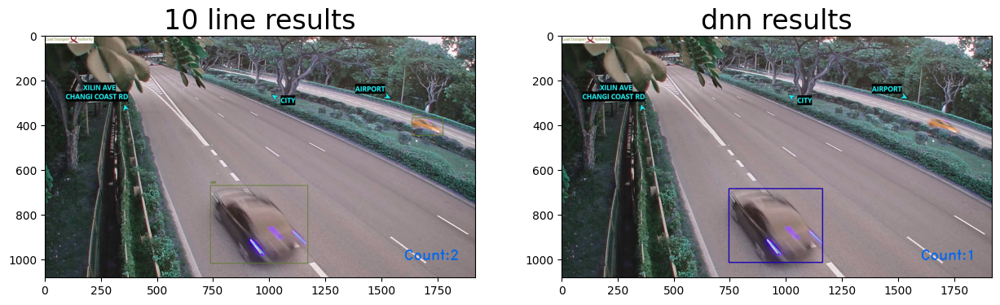

['car', 'car', 'car', 'car', 'car', 'traffic light', 'car']


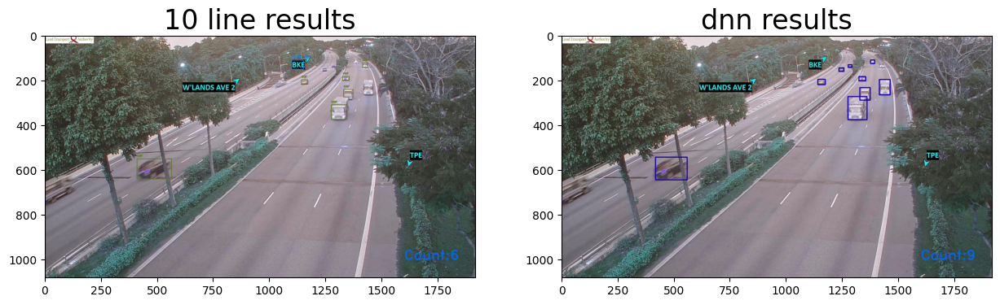

['car', 'truck', 'car', 'car']


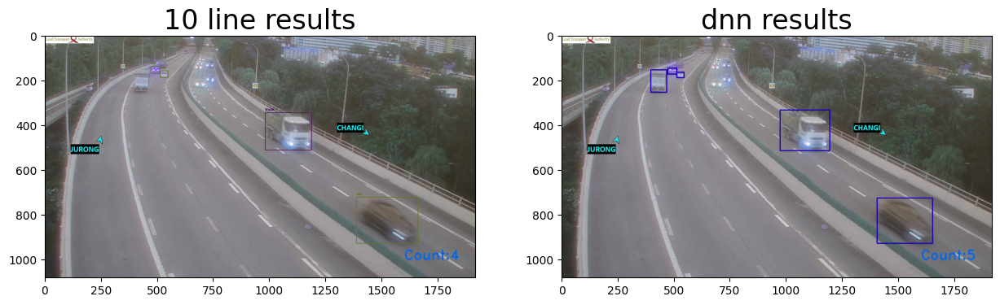

['bus', 'car']


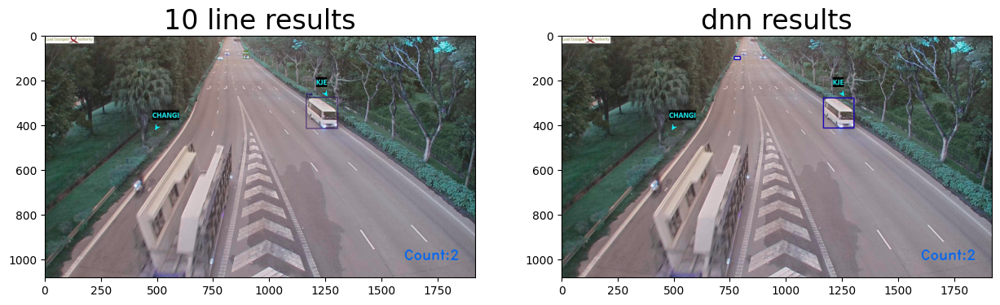

['car', 'car', 'car', 'car', 'car', 'car', 'car', 'person', 'car', 'car', 'car', 'car']


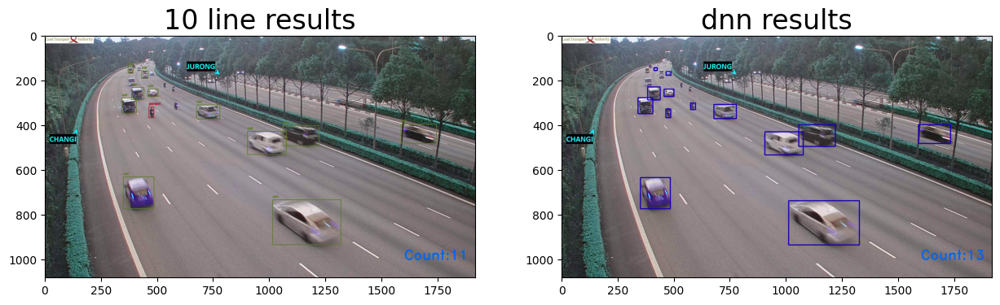

['car', 'truck', 'traffic light', 'car', 'traffic light', 'traffic light', 'traffic light']


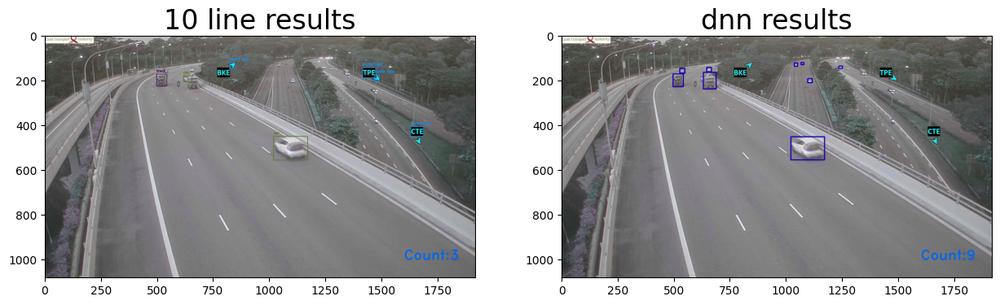

['car', 'car', 'car', 'truck', 'car']


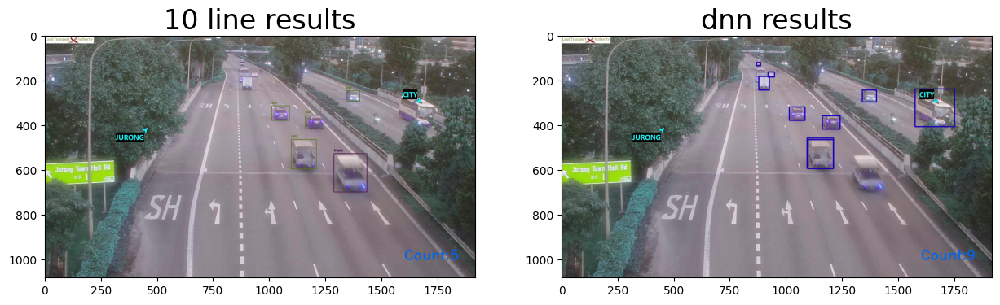

['car', 'car', 'car', 'car']


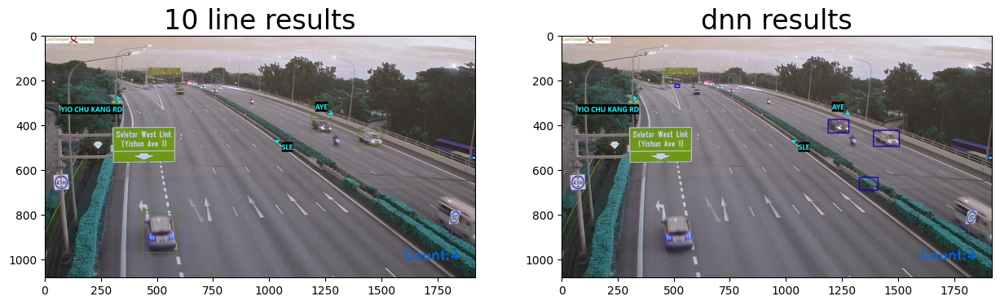

['car', 'car', 'car', 'car', 'traffic light', 'car']


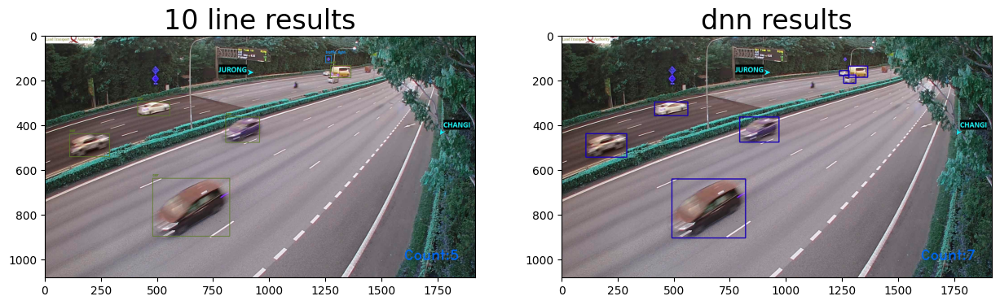

In [12]:
from glob import glob
imgs = glob("/Users/rebecca/images/2022_10_15_06_50/*.jpg")
#print(imgs)  # check for all the paths of the images
for img in imgs[:25]:
    plot_compare(img)